## Installations

In [ ]:
! python -m pip install opencv-python pillow towhee kagglehub

**Start Milvus**

Milvus vector database

In [ ]:
! wget https://github.com/milvus-io/milvus/releases/download/v2.2.10/milvus-standalone-docker-compose.yml -O docker-compose.yml
! docker-compose up -d
! python -m pip install -q pymilvus==2.2.11

In [ ]:
!pip install --upgrade 'numpy<2.0'
!pip install --upgrade 'pandas==2.0.0'
!pip install opencv-python pillow towhee
!pip install open_clip_torch
!pip install tensorflow_hub

#Only for running TF on Macbook M3
!pip uninstall -y tensorflow
!conda install -c apple tensorflow-deps
!pip install tensorflow-macos
!pip install tensorflow-metal

## Imports

In [ ]:
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import csv
from glob import glob
from pathlib import Path
from statistics import mean

from towhee import pipe, ops, DataCollection
from pymilvus import connections, FieldSchema, CollectionSchema, DataType, Collection, utility

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model

import torch
from PIL import Image, ImageDraw
import requests
from transformers import CLIPProcessor, CLIPModel, AutoModel

## Downlaod dataset

Here we use Polyvore outfits dataset
(https://www.kaggle.com/datasets/dnepozitek/polyvore-outfits)

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("dnepozitek/polyvore-outfits")

print("Path to dataset files:", path)

## Data preparation

In [15]:
polyvore_dir = '/Users/ranjeetsingh/Desktop/visual search/polyvore_outfits'

filename = os.path.join(polyvore_dir, 'polyvore_item_metadata.json')
with open(filename,'r') as fl:
    data = json.load(fl)

df = pd.DataFrame(data).T

df['id'] = df.index
df['path'] = df['id'].apply(lambda x: os.path.join(polyvore_dir, 'images', x + '.jpg'))
df['label'] = df['category_id']

df.head()
df[['id', 'path', 'label']].to_csv(os.path.join(polyvore_dir, 'polyvore_item_metadata.csv'),index=False)

In [6]:
from collections import defaultdict
import random

def split_data_with_limit(df, k=100, train_ratio=0.8, seed=42):
    """
    Splits the data into train and test sets with a limit of k images per category.
    
    Args:
        df (pd.DataFrame): The input DataFrame with a 'category_id' column.
        k (int): Maximum number of images per category in both train and test sets.
        train_ratio (float): Proportion of data to allocate to the train set.
        seed (int): Random seed for reproducibility.

    Returns:
        pd.DataFrame, pd.DataFrame: Train and test DataFrames.
    """
    # Group data by category_id
    grouped = defaultdict(list)
    for _, row in df.iterrows():
        grouped[row['label']].append(row)
    
    train_data = []
    test_data = []
    random.seed(seed)  # Set random seed for reproducibility
    
    for category, items in grouped.items():
        # Shuffle the items within each category
        random.shuffle(items)
        
        # Limit to k images per category
        items = items[:k]
        
        # Split into train and test sets
        split_idx = int(len(items) * train_ratio)
        train_data.extend(items[:split_idx])
        test_data.extend(items[split_idx:])
    
    # Convert back to DataFrame
    train_df = pd.DataFrame(train_data)
    test_df = pd.DataFrame(test_data)
    
    return train_df, test_df

# Split the data with a limit of 100 images per category
train_df, test_df = split_data_with_limit(df, k=100, train_ratio=0.8)

# Save to CSV
train_df.to_csv(os.path.join(polyvore_dir, 'polyvore_item_metadata_train.csv'),index=False)
test_df.to_csv(os.path.join(polyvore_dir, 'polyvore_item_metadata_test.csv'),index=False)

In [2]:
df = pd.read_csv(os.path.join(polyvore_dir, 'polyvore_item_metadata.csv'))
train_df = pd.read_csv(os.path.join(polyvore_dir, 'polyvore_item_metadata_train.csv'))
test_df = pd.read_csv(os.path.join(polyvore_dir, 'polyvore_item_metadata_test.csv'))
path_to_category_map = df.set_index('path')['label'].to_dict()
df.head(2)

,id,path,label
0,211990161,/Users/ranjeetsingh/Desktop/visual search/poly...,15
1,183179503,/Users/ranjeetsingh/Desktop/visual search/poly...,28


## Configs

In [28]:
MODEL = 'resnet50'
DEVICE = None # if None, use default device (cuda is enabled if available)

# Milvus parameters
HOST = '127.0.0.1'
PORT = '19530'
TOPK = 10
# DIM = 2048 
DIM = 512
COLLECTION_NAME = 'reverse_image_search'
INDEX_TYPE = 'IVF_FLAT'
METRIC_TYPE = 'L2'


INSERT_SRC = os.path.join(polyvore_dir, 'polyvore_item_metadata_train.csv')
# QUERY_SRC = os.path.join(polyvore_dir, 'test_images/*.jpg')
QUERY_SRC = os.path.join(polyvore_dir, 'polyvore_item_metadata_test.csv')

## Embedding pipeline <a class="anchor" id="embedding-pipeline"></a>

In [ ]:
#Clip
# model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
# processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# FCLIP
model = AutoModel.from_pretrained("Marqo/marqo-fashionCLIP", trust_remote_code=True)


# Function to get image embeddings
def get_embedding(image_path):
    # Load and preprocess the image
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt")  # Preprocess the image

    # Extract image embeddings
    with torch.no_grad():
        outputs = model.get_image_features(**inputs)  # Get image features

    # Normalize embeddings if needed
    embeddings = outputs / outputs.norm(p=2, dim=-1, keepdim=True)
    return embeddings.flatten().numpy()

emb = get_embedding('workflow.png')
emb.shape
# type(emb)

In [11]:
# Load ResNet50 pre-trained
# base_model = ResNet50(weights="imagenet", include_top=True)
# embedding_model = Model(inputs=base_model.input, outputs=base_model.get_layer("avg_pool").output)

#Fine-tuned on polyvore
fine_tuned_model = tf.keras.models.load_model('/Users/ranjeetsingh/Desktop/visual search/polyvore_resnet.h5')
embedding_model = Model(inputs=fine_tuned_model.input, outputs=fine_tuned_model.get_layer("global_average_pooling2d_11").output)

In [26]:
def preprocess_image(image_path):
    from PIL import Image
    # Load the image and resize to 224x224 (ResNet input size)
    image = Image.open(image_path).convert("RGB")
    image = image.resize((224, 224))
    
    # Convert the image to a numpy array
    image_array = np.array(image)
    
    # Expand dimensions to match model input and preprocess
    image_array = np.expand_dims(image_array, axis=0)
    image_array = preprocess_input(image_array)
    
    return image_array


def get_embedding(input_image):
    # input_image = preprocess_image(image_path)
    
    # Get embeddings from the image
    embedding = embedding_model.predict(input_image)
    
    # Flatten the embedding if needed
    embedding_flat = embedding.flatten()    
    
    return embedding_flat

In [19]:
# Load image path
def load_image(x):
    if x.endswith('csv'):
        with open(x) as f:
            reader = csv.reader(f)
            next(reader)
            for item in reader:
                yield item[1]
    else:
        for item in glob(x):
            yield item

In [78]:
#Resnet
# p_embed = (
#     pipe.input('src')
#         .flat_map('src', 'img_path', load_image)
#         .map('img_path', 'img', preprocess_image)
#         .map('img', 'vec', get_embedding)
# )

# Display embedding result, no need for implementation
# p_display = p_embed.output('img_path', 'img', 'vec')

#CLIP
p_embed = (
    pipe.input('src')
        .flat_map('src', 'img', load_image)
        .map('img', 'vec', get_embedding)
)
# Display embedding result, no need for implementation
p_display = p_embed.output('img', 'vec')

In [ ]:
DataCollection(p_display(os.path.join(polyvore_dir,'test_images/*.jpg'))).show()
# list(load_image(os.path.join(polyvore_dir,'test_images/*.jpg')))

### Set up Vector DB <a class="anchor" id="steps"></a>


1. create a Milvus collection
2. insert data into collection

In [80]:
# Create milvus collection (delete first if exists)
def create_milvus_collection(collection_name, dim, replace_collection=False):
    if utility.has_collection(collection_name) and replace_collection:
        utility.drop_collection(collection_name)
    
    fields = [
        FieldSchema(name='path', dtype=DataType.VARCHAR, description='path to image', max_length=500, 
                    is_primary=True, auto_id=False),
        FieldSchema(name='embedding', dtype=DataType.FLOAT_VECTOR, description='image embedding vectors', dim=dim)
    ]
    schema = CollectionSchema(fields=fields, description='reverse image search')
    collection = Collection(name=collection_name, schema=schema)

    index_params = {
        'metric_type': METRIC_TYPE,
        'index_type': INDEX_TYPE,
        'params': {"nlist": dim}
    }
    collection.create_index(field_name='embedding', index_params=index_params)
    return collection

Connect to Milvus with `HOST` & `PORT` and create collection with `COLLECTION_NAME` & `DIM`:

In [81]:
# Connect to Milvus service
connections.connect(host=HOST, port=PORT)

# Create collection
collection = create_milvus_collection(COLLECTION_NAME, DIM, replace_collection=True)
print(f'A new collection created: {COLLECTION_NAME}')

A new collection created: reverse_image_search


In [82]:
print('Number of data inserted:', collection.num_entities)

Number of data inserted: 0


#### 2. Insert data <a class="anchor" id="step2"></a>

This step uses an **insert pipeline** to insert image embeddings into Milvus collection. The insert pipeline consists of the embedding pipeline and the Milvus insert operator.

In [84]:
# Insert pipeline
#Resnet
# p_insert = (
#         p_embed.map(('img_path', 'vec'), 'mr', ops.ann_insert.milvus_client(
#                     host=HOST,
#                     port=PORT,
#                     collection_name=COLLECTION_NAME
#                     ))
#           .output('mr')
# )

#CLIP
p_insert = (
        p_embed.map(('img', 'vec'), 'mr', ops.ann_insert.milvus_client(
                    host=HOST,
                    port=PORT,
                    collection_name=COLLECTION_NAME
                    ))
          .output('mr')
)

Insert all candidate images for  `INSERT_SRC`:

In [85]:
p_insert(INSERT_SRC)

2024-11-17 22:58:57,799 - 15915741184 - node.py-node:167 - INFO: Begin to run Node-_input
2024-11-17 22:58:57,800 - 15932567552 - node.py-node:167 - INFO: Begin to run Node-load_image-0
2024-11-17 22:58:57,801 - 15949393920 - node.py-node:167 - INFO: Begin to run Node-get_embedding-1
2024-11-17 22:58:57,801 - 16117723136 - node.py-node:167 - INFO: Begin to run Node-ann-insert/milvus-client-2
2024-11-17 22:58:57,802 - 16185061376 - node.py-node:167 - INFO: Begin to run Node-_output


In [86]:
# Check collection
print('Number of data inserted:', collection.num_entities)

Number of data inserted: 7233


## Sample Image Search <a class="anchor" id="step3"></a>

search image embeddings across Milvus collection given a pattern or csv of image path(s)

In [87]:
# Search pipeline
p_search_pre = (
        p_embed.map('vec', ('search_res'), ops.ann_search.milvus_client(
                    host=HOST, port=PORT, limit=TOPK,
                    collection_name=COLLECTION_NAME))
               .map('search_res', 'pred', lambda x: [str(Path(y[0]).resolve()) for y in x])
#                .output('img_path', 'pred')
)

#Resnet
# p_search = p_search_pre.output('img_path', 'pred')
#CLIP
p_search = p_search_pre.output('img', 'pred')

In [89]:
# Search for example query image(s)

# dc = p_search(QUERY_SRC)
dc = p_search(os.path.join(polyvore_dir,'test_images/*.jpg'))

# Display search results with image paths
DataCollection(dc).show()

img,pred
/Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/test_images/test_image.jpg,/Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/213564215.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/215335582.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/197342963.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/131205926.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/195744116.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/211767184.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/136195951.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/203913940.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/161629684.jpg /Users/ranjeetsingh/Desktop/visual search/polyvore_outfits/images/133786441.jpg


2024-11-17 23:09:38,313 - 8180234304 - TiffImagePlugin.py-TiffImagePlugin:927 - DEBUG: tag: Orientation (274) - type: short (3) - value: b'\x01\x00'
2024-11-17 23:09:38,313 - 8180234304 - TiffImagePlugin.py-TiffImagePlugin:927 - DEBUG: tag: XResolution (282) - type: rational (5) Tag Location: 34 - Data Location: 86 - value: b'H\x00\x00\x00\x01\x00\x00\x00'
2024-11-17 23:09:38,314 - 8180234304 - TiffImagePlugin.py-TiffImagePlugin:927 - DEBUG: tag: YResolution (283) - type: rational (5) Tag Location: 46 - Data Location: 94 - value: b'H\x00\x00\x00\x01\x00\x00\x00'
2024-11-17 23:09:38,314 - 8180234304 - TiffImagePlugin.py-TiffImagePlugin:927 - DEBUG: tag: ResolutionUnit (296) - type: short (3) - value: b'\x02\x00'
2024-11-17 23:09:38,314 - 8180234304 - TiffImagePlugin.py-TiffImagePlugin:927 - DEBUG: tag: YCbCrPositioning (531) - type: short (3) - value: b'\x01\x00'
2024-11-17 23:09:38,314 - 8180234304 - TiffImagePlugin.py-TiffImagePlugin:927 - DEBUG: tag: ExifIFD (34665) - type: long (4) 

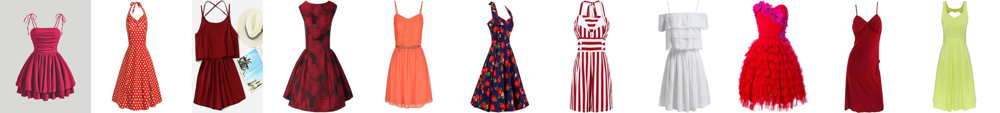

In [90]:
# t = p_search(QUERY_SRC).to_list()
t = p_search(os.path.join(polyvore_dir,'test_images/*.jpg')).to_list()

from PIL import Image, ImageDraw, ImageFont

def display_anchor_and_similar_images(data, save_path=None):
    """
    Display anchor image and its visually similar images as a single composite image.

    Args:
    - data (list): A list containing anchor image and a list of similar images.
                   Format: [['anchor_path', ['similar1_path', 'similar2_path', ...]]]
    - save_path (str, optional): If specified, saves the output composite image to this path.

    Returns:
    - PIL.Image: Composite image containing the anchor and similar images.
    """
    for anchor_path, similar_images in data:
        # Load anchor and similar images
        anchor_img = Image.open(anchor_path)
        similar_imgs = [Image.open(img_path) for img_path in similar_images]

        # Resize all images to the same height as the anchor image
        img_height = anchor_img.height
        img_width = anchor_img.width
        similar_imgs = [img.resize((img_width, img_height)) for img in similar_imgs]

        # Create a composite canvas
        total_width = img_width * (1 + len(similar_imgs))  # Anchor + similar images
        composite = Image.new("RGB", (total_width, img_height), (255, 255, 255))

        # Paste anchor image
        composite.paste(anchor_img, (0, 0))

        # Paste similar images
        for i, img in enumerate(similar_imgs):
            composite.paste(img, ((i + 1) * img_width, 0))

        # Optionally save the composite image
        if save_path:
            composite.save(save_path)

        # Display the composite image
        composite.show()

        return composite

# Call the function
display_anchor_and_similar_images(t)

## Benchmark <a class="anchor" id="benchmark"></a>

To evaluate the system against ground truth, we consider images in the same class as relevant items.
Uses metric of [mAP](https://www.educative.io/answers/what-is-the-mean-average-precision-in-information-retrieval), which is mean average precision over all queries.


For each query image, we expect to get images of the same class from the database. So we define a function which returns a list of image paths from candidates as the ground truth given a query image path. The ground truth should share the same class or category as the query image.

In [91]:
# Get ground truth by path of query image

def ground_truth(path):
    return train_df[train_df.label==path_to_category_map[path]]['path'].tolist()

# Calculate Average Precision by a list of predictions and a list of ground truths
def get_ap(pred: list, gt: list):
    ct = 0
    score = 0.
    for i, n in enumerate(pred):
        if n in gt:
            ct += 1
            score += (ct / (i + 1))
    if ct == 0:
        ap = 0
    else:
        ap = score / ct
    return ap

In [92]:
p_eval = (
    #ResNet
    # p_search_pre.map('img_path', 'gt', ground_truth)
    #CLIP
    p_search_pre.map('img', 'gt', ground_truth)
                .map(('pred', 'gt'), 'ap', get_ap)
                .output('ap')
)

In [93]:
import time
# Run evaluation pipeline over all test data
start = time.time()
# bm = p_eval('test/*/*.JPEG')
bm = p_eval(QUERY_SRC)
end = time.time()

# Group AP in a list
res = DataCollection(bm).to_list()

2024-11-17 23:11:00,578 - 16425938944 - node.py-node:167 - INFO: Begin to run Node-_input
2024-11-17 23:11:00,580 - 16442765312 - node.py-node:167 - INFO: Begin to run Node-load_image-0
2024-11-17 23:11:00,580 - 16459591680 - node.py-node:167 - INFO: Begin to run Node-get_embedding-1
2024-11-17 23:11:00,581 - 16476418048 - node.py-node:167 - INFO: Begin to run Node-ann-search/milvus-client-2
2024-11-17 23:11:00,581 - 16493244416 - node.py-node:167 - INFO: Begin to run Node-lambda-3
2024-11-17 23:11:00,582 - 16510070784 - node.py-node:167 - INFO: Begin to run Node-ground_truth-4
2024-11-17 23:11:00,583 - 16526897152 - node.py-node:167 - INFO: Begin to run Node-get_ap-5
2024-11-17 23:11:00,583 - 16425938944 - node.py-node:167 - INFO: Begin to run Node-_output


In [94]:
# Calculate mAP
mAP = mean([x.ap for x in res])

print(f'mAP@{TOPK}: {mAP}')
print(f'qps: {len(res) / (end - start)}')

mAP@10: 0.6004831857767506
qps: 17.017453743035862
